In [1]:
# Imports and setup
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

sns.set(style='whitegrid', palette='muted', font_scale=1.1)
plt.rcParams['figure.figsize'] = (12, 6)

In [2]:
# Load dataset
df = pd.read_csv('../data/sierraleone-bumbuna.csv', parse_dates=['Timestamp'])
df.head()

,Timestamp,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
0,2021-10-30 00:01:00,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.1,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN
1,2021-10-30 00:02:00,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.2,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN
2,2021-10-30 00:03:00,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.2,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN
3,2021-10-30 00:04:00,-0.7,0.0,-0.8,0.0,0.0,21.9,99.3,0.0,0.0,0.0,0.0,0.0,1002,0,0.1,22.3,22.6,NaN
4,2021-10-30 00:05:00,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.3,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN


In [3]:
# Summary statistics & missing values
display(df.describe())
missing = df.isna().sum()
print("Missing values per column:\n", missing)
missing_percent = df.isna().mean() * 100
print("Columns with >5% missing:\n", missing_percent[missing_percent > 5])

,Timestamp,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
count,525600,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,0.0
mean,2022-04-30 12:00:30.000000768,201.957515,116.376337,113.720571,206.643095,198.114691,26.319394,79.448857,1.146113,1.691606,0.363823,133.044668,7.172220,999.876469,0.000967,0.004806,32.504263,32.593091,NaN
min,2021-10-30 00:01:00,-19.500000,-7.800000,-17.900000,0.000000,0.000000,12.300000,9.900000,0.000000,0.000000,0.000000,0.000000,0.000000,993.000000,0.000000,0.000000,10.700000,11.100000,NaN
25%,2022-01-29 06:00:45,-2.800000,-0.300000,-3.800000,0.000000,0.000000,23.100000,68.700000,0.000000,0.000000,0.000000,0.000000,0.000000,999.000000,0.000000,0.000000,23.500000,23.800000,NaN
50%,2022-04-30 12:00:30,0.300000,-0.100000,-0.100000,3.600000,3.400000,25.300000,85.400000,0.800000,1.600000,0.400000,161.500000,6.200000,1000.000000,0.000000,0.000000,26.600000,26.900000,NaN
75%,2022-07-30 18:00:15,362.400000,107.000000,224.700000,359.500000,345.400000,29.400000,96.700000,2.000000,2.600000,0.600000,234.100000,12.000000,1001.000000,0.000000,0.000000,40.900000,41.300000,NaN
max,2022-10-30 00:00:00,1499.000000,946.000000,892.000000,1507.000000,1473.000000,39.900000,100.000000,19.200000,23.900000,4.100000,360.000000,98.400000,1006.000000,1.000000,2.400000,72.800000,70.400000,NaN
std,NaN,298.495150,218.652659,158.946032,300.896893,288.889073,4.398605,20.520775,1.239248,1.617053,0.295000,114.284792,7.535093,2.104419,0.031074,0.047556,12.434899,12.009161,NaN


Missing values per column:
 Timestamp             0
GHI                   0
DNI                   0
DHI                   0
ModA                  0
ModB                  0
Tamb                  0
RH                    0
WS                    0
WSgust                0
WSstdev               0
WD                    0
WDstdev               0
BP                    0
Cleaning              0
Precipitation         0
TModA                 0
TModB                 0
Comments         525600
dtype: int64
Columns with >5% missing:
 Comments    100.0
dtype: float64


In [4]:
# Outlier detection
from scipy.stats import zscore
cols_to_check = ['GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'WS', 'WSgust']
z_scores = np.abs(df[cols_to_check].apply(zscore, nan_policy='omit'))
outliers = (z_scores > 3).any(axis=1)
print(f"Number of outliers detected: {outliers.sum()}")

Number of outliers detected: 16292


In [5]:
# Clean missing values and remove outliers
for col in cols_to_check:
    df[col].fillna(df[col].median(), inplace=True)
df = df[~outliers]
df.info()

C:\Users\mikiyas\AppData\Local\Temp\ipykernel_17700\3346658971.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].median(), inplace=True)
C:\Users\mikiyas\AppData\Local\Temp\ipykernel_17700\3346658971.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For e

<class 'pandas.core.frame.DataFrame'>
Index: 509308 entries, 0 to 525599
Data columns (total 19 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Timestamp      509308 non-null  datetime64[ns]
 1   GHI            509308 non-null  float64       
 2   DNI            509308 non-null  float64       
 3   DHI            509308 non-null  float64       
 4   ModA           509308 non-null  float64       
 5   ModB           509308 non-null  float64       
 6   Tamb           509308 non-null  float64       
 7   RH             509308 non-null  float64       
 8   WS             509308 non-null  float64       
 9   WSgust         509308 non-null  float64       
 10  WSstdev        509308 non-null  float64       
 11  WD             509308 non-null  float64       
 12  WDstdev        509308 non-null  float64       
 13  BP             509308 non-null  int64         
 14  Cleaning       509308 non-null  int64         
 15  Preci

c:\Users\mikiyas\Documents\ML\venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


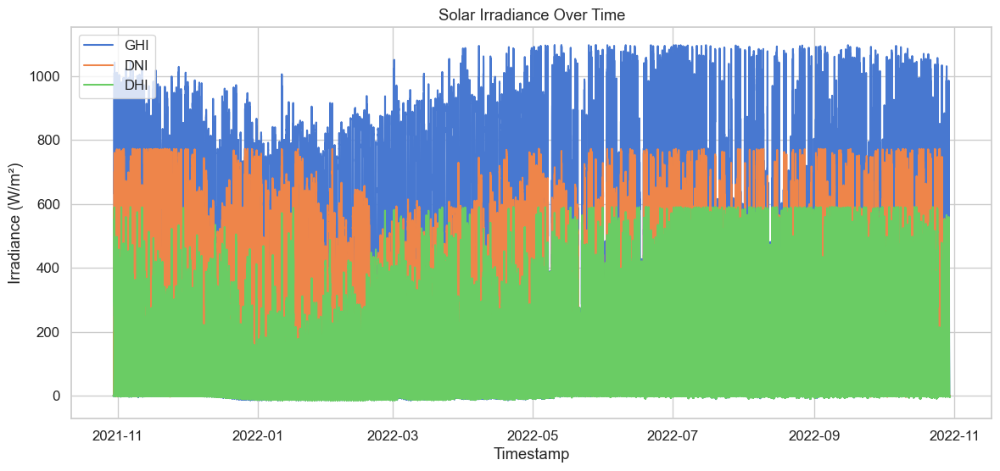

In [6]:
# Time series plot
plt.figure(figsize=(14,6))
plt.plot(df['Timestamp'], df['GHI'], label='GHI')
plt.plot(df['Timestamp'], df['DNI'], label='DNI')
plt.plot(df['Timestamp'], df['DHI'], label='DHI')
plt.xlabel('Timestamp')
plt.ylabel('Irradiance (W/m²)')
plt.title('Solar Irradiance Over Time')
plt.legend()
plt.show()

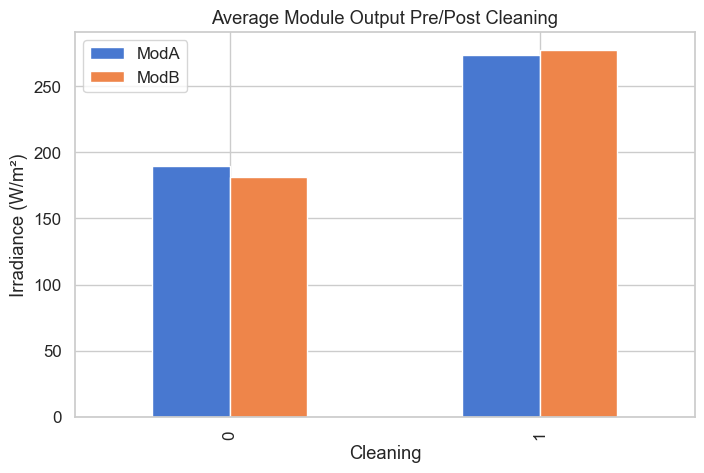

In [7]:
# Cleaning impact
cleaning_avg = df.groupby('Cleaning')[['ModA','ModB']].mean()
cleaning_avg.plot(kind='bar', figsize=(8,5))
plt.title('Average Module Output Pre/Post Cleaning')
plt.ylabel('Irradiance (W/m²)')
plt.show()

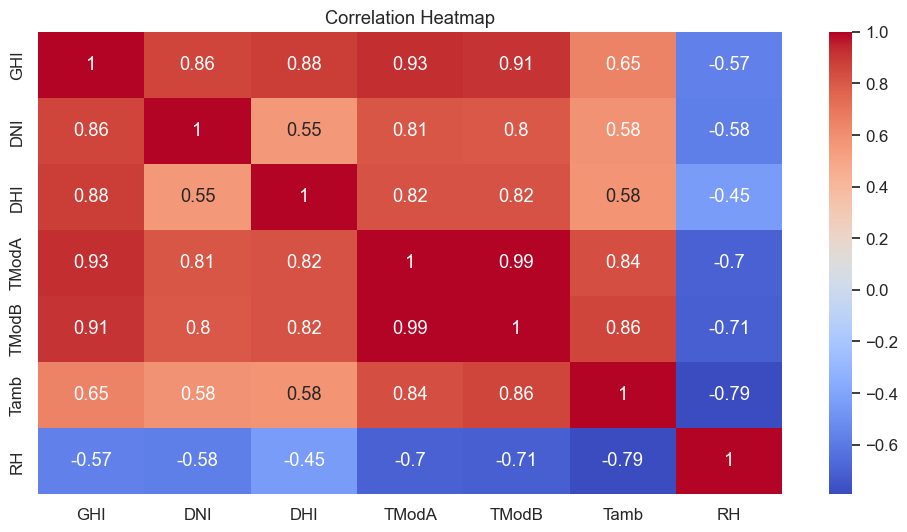

In [8]:
# Correlation heatmap
corr_cols = ['GHI','DNI','DHI','TModA','TModB','Tamb','RH']
sns.heatmap(df[corr_cols].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

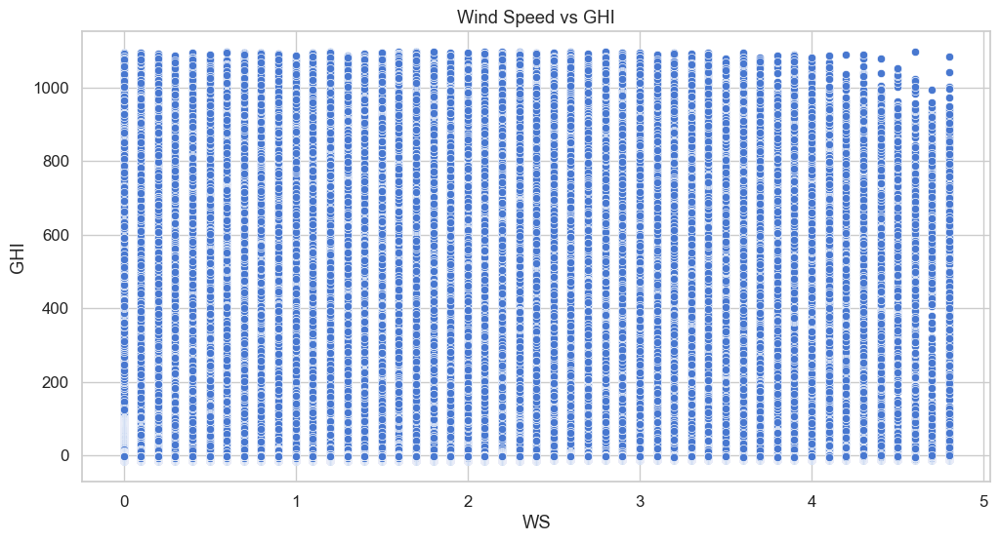

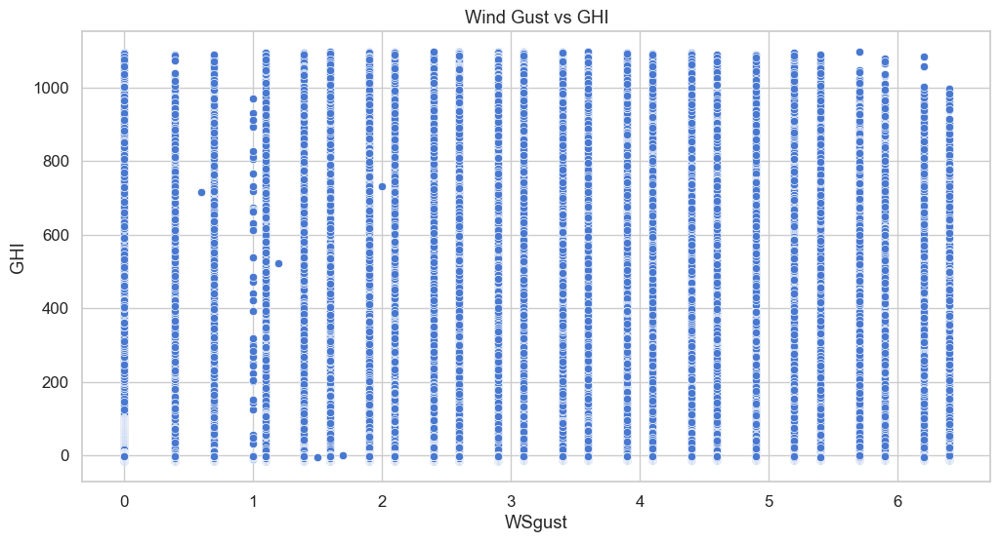

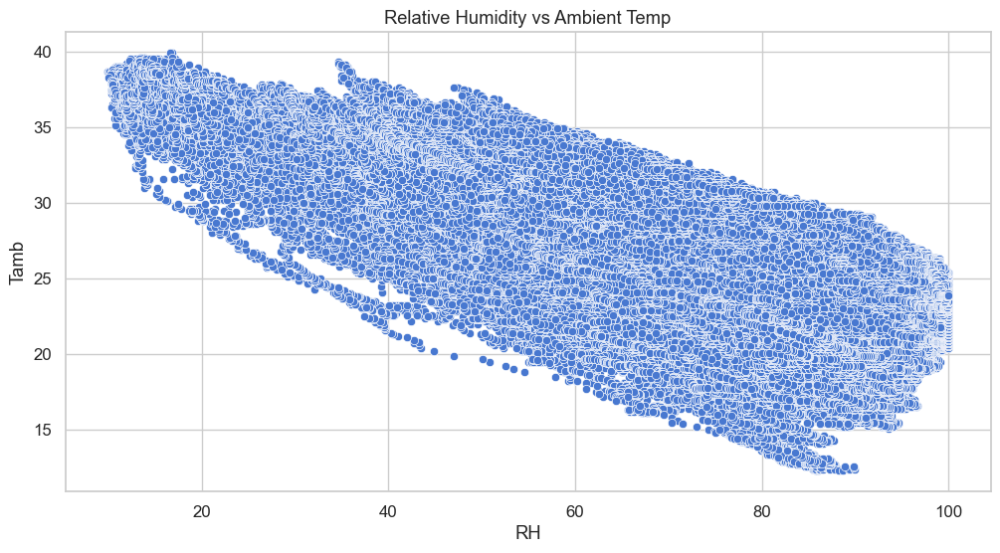

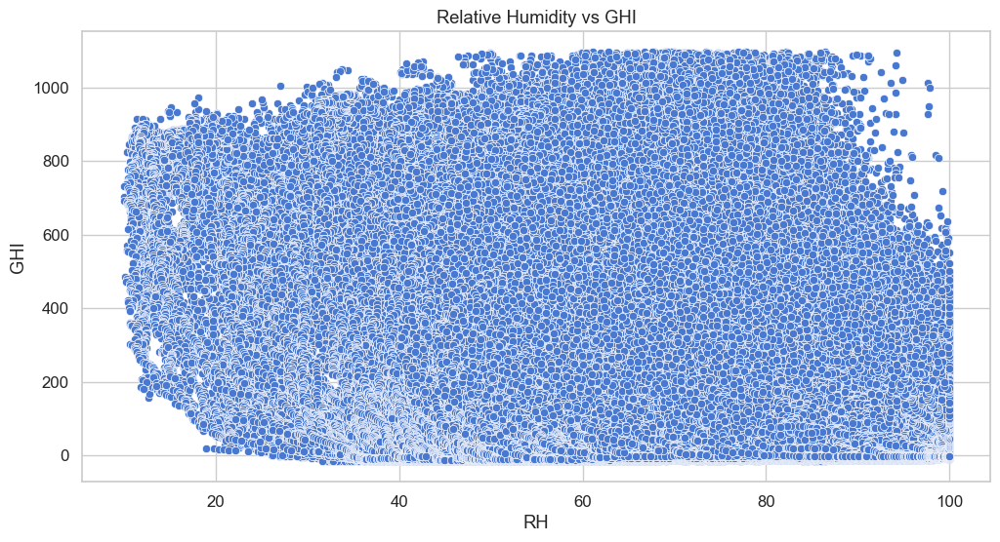

In [9]:
# Scatter plots
sns.scatterplot(data=df, x='WS', y='GHI')
plt.title('Wind Speed vs GHI')
plt.show()

sns.scatterplot(data=df, x='WSgust', y='GHI')
plt.title('Wind Gust vs GHI')
plt.show()

sns.scatterplot(data=df, x='RH', y='Tamb')
plt.title('Relative Humidity vs Ambient Temp')
plt.show()

sns.scatterplot(data=df, x='RH', y='GHI')
plt.title('Relative Humidity vs GHI')
plt.show()

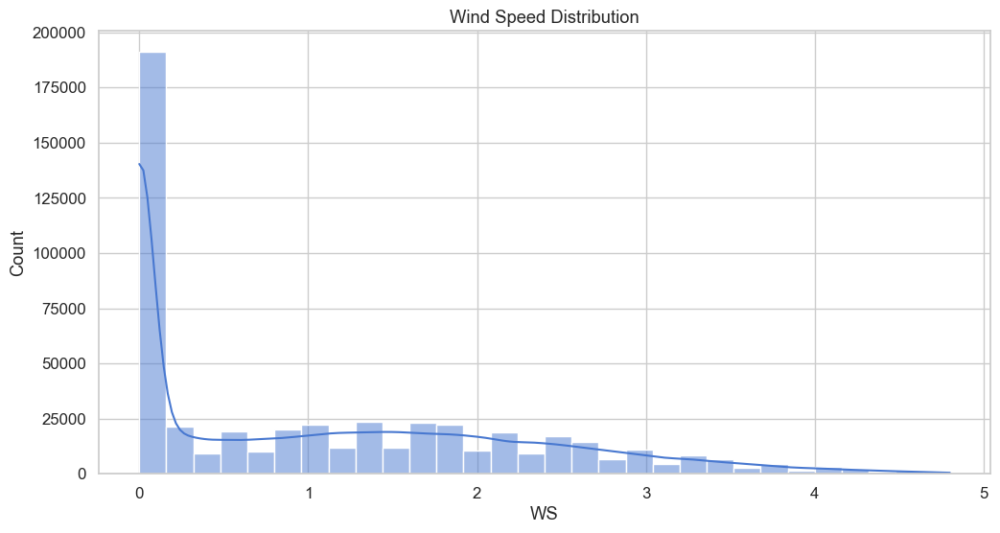

In [10]:
# Wind distribution
sns.histplot(df['WS'], bins=30, kde=True)
plt.title('Wind Speed Distribution')
plt.show()

fig = px.bar_polar(df, r='WS', theta='WD', color='WS', template='plotly_dark')
fig.update_layout(title='Wind Rose')
fig.show()

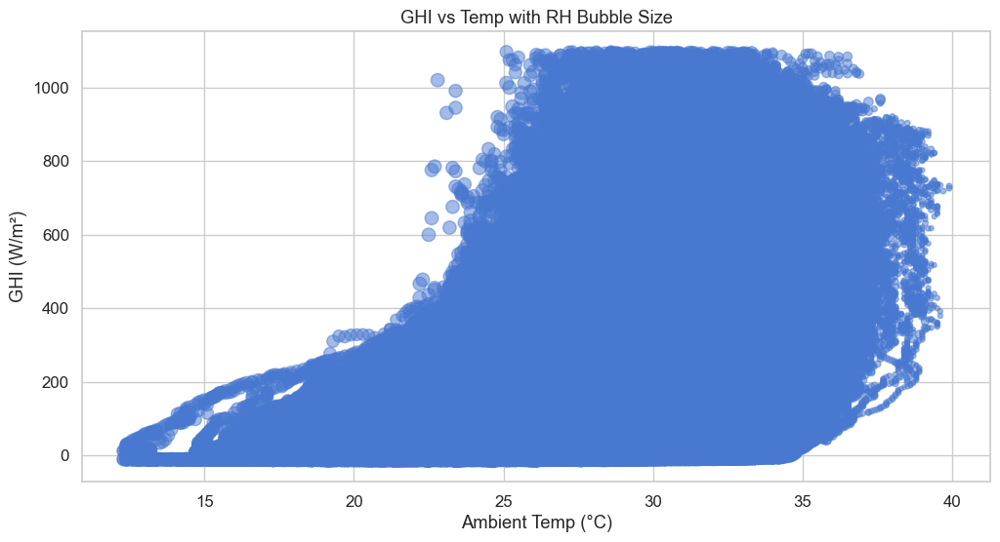

In [11]:
# Temperature & bubble chart
plt.scatter(df['Tamb'], df['GHI'], s=df['RH'], alpha=0.5)
plt.xlabel('Ambient Temp (°C)')
plt.ylabel('GHI (W/m²)')
plt.title('GHI vs Temp with RH Bubble Size')
plt.show()

In [12]:
# Export cleaned CSV
df.to_csv('../data/sierra_leone_clean.csv', index=False)